# Исследование рынка заведений общественного питания г. Москвы

## Цель исследования
Подготовить исследование заведение общественного питания в городе Москве , найти интересные особенности которые помогут в выборе подходящего инвесторам места.

## Описание данных
Файл moscow_places.csv:
*   name — название заведения;
*   address — адрес заведения;
*   category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
*   hours — информация о днях и часах работы;
*   lat — широта географической точки, в которой находится заведение;
*   lng — долгота географической точки, в которой находится заведение;
*   rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
*   price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
*   avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  *   «Средний счёт: 1000–1500 ₽»;
  *   «Цена чашки капучино: 130–220 ₽»;
  *   «Цена бокала пива: 400–600 ₽».
и так далее;
*   middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  *   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  *   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  *   Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
*   middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  *   Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  *   Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  *   Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
*   chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
  *   0 — заведение не является сетевым
  *   1 — заведение является сетевым
*   district — административный район, в котором находится заведение, например Центральный административный округ;
*   seats — количество посадочных мест.

In [ ]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px
from scipy import stats as st
from scipy.stats import binom, poisson, norm
from math import sqrt, factorial
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

In [ ]:
# Настройки
# Отображение всех колонок таблиц
pd.set_option('display.max_columns', None)
# ширина колонок при выводе
pd.set_option('display.max_colwidth', 1000)
# устанавливаем стиль графиков
sns.set_style('whitegrid')
sns.set_palette('coolwarm')

## Загрузка данных


In [ ]:
# загружаем датафреймы
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [ ]:
# вывода информации о датафрейме
print(df.info())
print('-' * 50)
display(df.sample(10))
print('-' * 50)
print('Количество явных дубликатов в датафрейме:', df.duplicated().sum(), '~', \
      round(df.duplicated().sum()/df.shape[0] * 100, 2 ), '%')
print('-' * 50)
print('Наличие пропусков')
print(df.isna().sum())
print('-' * 50)
print('Статистические данные датафрейма')
display(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
--------------------------------------------------


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
4527,Хачапури и вино,ресторан,"Москва, улица Солянка, 1/2с1",Центральный административный округ,"пн-ср 12:00–23:00; чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.753841,37.638124,4.7,NaN,NaN,NaN,NaN,1,NaN
2935,Прогресс кафе-бар Еда,ресторан,"Москва, Измайловское шоссе, 69Д",Восточный административный округ,"ежедневно, 08:00–22:00",55.788414,37.748008,3.6,NaN,Средний счёт:100–500 ₽,300.0,NaN,0,55.0
6261,Мое кафе,кафе,"Москва, Черёмушкинский проезд, 5",Юго-Западный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–19:00",55.691899,37.572497,3.7,низкие,Средний счёт:от 100 ₽,100.0,NaN,1,NaN
2814,Грузинская кухня,ресторан,"Москва, 6-я Парковая улица, 21",Восточный административный округ,"ежедневно, 10:00–22:00",55.792471,37.790331,4.2,NaN,NaN,NaN,NaN,1,NaN
6585,Osteria Mario,пиццерия,"Москва, проспект Вернадского, вл41",Западный административный округ,"ежедневно, 12:00–23:00",55.674341,37.502521,4.5,NaN,Средний счёт:1000–1500 ₽,1250.0,NaN,1,NaN
485,Домино'с Пицца,пиццерия,"Москва, Смольная улица, 24А",Северный административный округ,"ежедневно, 10:00–23:00",55.860431,37.483147,4.3,средние,Средний счёт:от 500 ₽,500.0,NaN,1,40.0
1257,Ресторан & бар Бокас Дель Торо,"бар,паб","Москва, улица Маршала Рыбалко, 18, корп. 1",Северо-Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.799910,37.484745,4.6,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,95.0
825,Студия 2000,ресторан,"Москва, Дмитровское шоссе, 75",Северный административный округ,"ежедневно, 11:00–23:00",55.857818,37.557766,4.4,средние,Средний счёт:350 ₽,350.0,NaN,0,40.0
2589,Алло! Пицца,пиццерия,"Москва, улица Константина Федина, 11, стр. 4",Восточный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–02:00; вс 10:00–23:00",55.806808,37.801041,4.9,NaN,NaN,NaN,NaN,1,NaN
5570,Burger Shaw,быстрое питание,"Москва, Суздальская улица, 30/2",Восточный административный округ,"ежедневно, круглосуточно",55.743886,37.863454,3.8,NaN,NaN,NaN,NaN,0,12.0


--------------------------------------------------
Количество явных дубликатов в датафрейме: 0 ~ 0.0 %
--------------------------------------------------
Наличие пропусков
name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
--------------------------------------------------
Статистические данные датафрейма


,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


## Предобработка данных

Проверим значения в столбцах на уникальность

In [ ]:
# посмотрим уникальные значения в названиях заведений
df['name'].nunique()
print('Количество уникальных значений в названии заведения:', {df['name'].nunique()})
df['name_lower'] = df['name'].str.lower()
print('Количество уникальных значений после приведения к нижнему регистру:', {df['name_lower'].nunique()})

Количество уникальных значений в названии заведения: {5614}
Количество уникальных значений после приведения к нижнему регистру: {5512}


In [ ]:
# посмотрим уникальные значения в категории заведений
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Проверим столбцы с большим количеством пропусков

In [ ]:
df[['price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].sample(15)

,price,avg_bill,middle_avg_bill,middle_coffee_cup,seats
4021,NaN,Средний счёт:от 600 ₽,600.0,NaN,NaN
4142,NaN,Цена чашки капучино:90–99 ₽,NaN,94.0,6.0
2879,NaN,NaN,NaN,NaN,75.0
8148,NaN,NaN,NaN,NaN,NaN
7383,NaN,NaN,NaN,NaN,NaN
5258,NaN,NaN,NaN,NaN,NaN
2295,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,60.0
273,NaN,NaN,NaN,NaN,100.0
3132,выше среднего,Средний счёт:800–1500 ₽,1150.0,NaN,NaN
445,NaN,NaN,NaN,NaN,NaN


Пропущенные значения в столбцах 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats' заполнить корректно не представляется возможным. Оставим как есть.

Создадим столбец 'street' с названиями улиц из столбца с адресом

In [ ]:
df['street'] = df['address'].str.extract(pat = ',(.*?),')
df['street'].sample(10)

1914        улица Сущёвский Вал
5064            Пятницкая улица
95             Дубнинская улица
4155     Кропоткинский переулок
1822     улица Верхняя Масловка
5164               улица Зацепа
1322           проезд Аэропорта
8329         Рязанский проспект
6475            Шоссейная улица
609              Вишнёвая улица
Name: street, dtype: object

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)


In [ ]:
df['is_24/7'] = df['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
df[['hours', 'is_24/7']].sample(15)

,hours,is_24/7
5374,"ежедневно, 07:00–00:00",False
1547,"ежедневно, 10:00–23:00",False
8080,"ежедневно, 12:00–21:00",False
3430,"ежедневно, 12:00–02:00",False
759,"ежедневно, 10:00–22:00",False
5185,"пн-пт 08:00–22:00; сб,вс 09:00–21:00",False
8295,"ежедневно, круглосуточно",True
4867,"пн-пт 11:00–21:00; сб,вс 11:00–19:00",False
8350,"ежедневно, 10:00–22:00",False
1099,"ежедневно, 10:00–22:00",False


### Итоги загрузки и предобработки данных
*   В датафрейм 'df' загрузили данные из детасета 'moscow_places.csv'
*   В датафрейм 8405 строк, 14 столбцов
*   Явные дубликаты отсутствуют
*   Приведя столбец к нижнему регистру обнаружили неявные дубликаты в названиях заведений

## Анализ данных

### 2.1. Количество объектов общественного питания по категориям

In [ ]:
df_category = df['category'].value_counts().reset_index()
df_category.columns = ['category','count']
#df_category

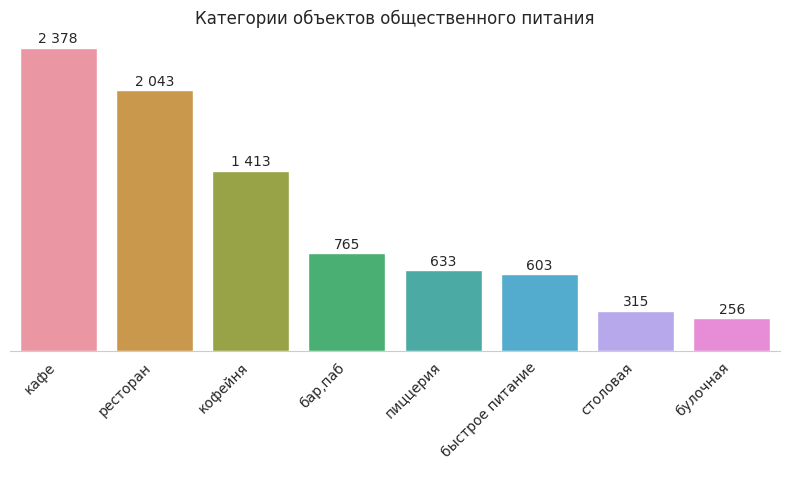

In [ ]:
# визуализация
plt.figure(figsize=(8,5))

ax=sns.barplot(x='category',
               y="count",
               data=df_category,
               order=df_category.sort_values('count', ascending = False).category)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment ='right', size=10)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.title("Категории объектов общественного питания", size=12)
ax.axes.get_yaxis().set_visible(False)
sns.despine(left=True)
plt.xlabel(" ")
plt.tight_layout()

Первое место по количеству заведений занимают заведения категории кафе, На втором месте рестораны. Меньше всего булочных и столовых.

### Количество посадочных мест в заведениях по категориям

In [ ]:
seats_by_category = df.pivot_table(index = 'category', values = 'seats', aggfunc = 'median').sort_values(by = 'seats', ascending = False).reset_index()
seats_by_category.columns = ['category', 'seats_median']
#seats_by_category

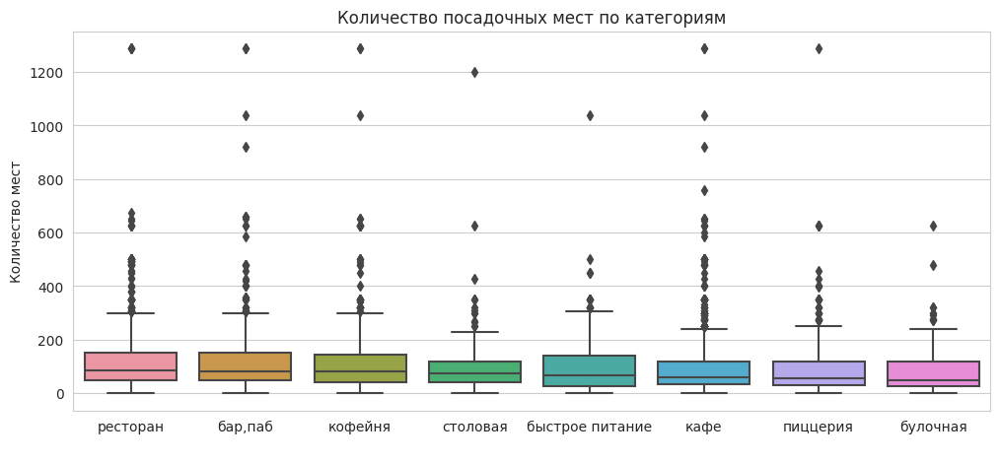

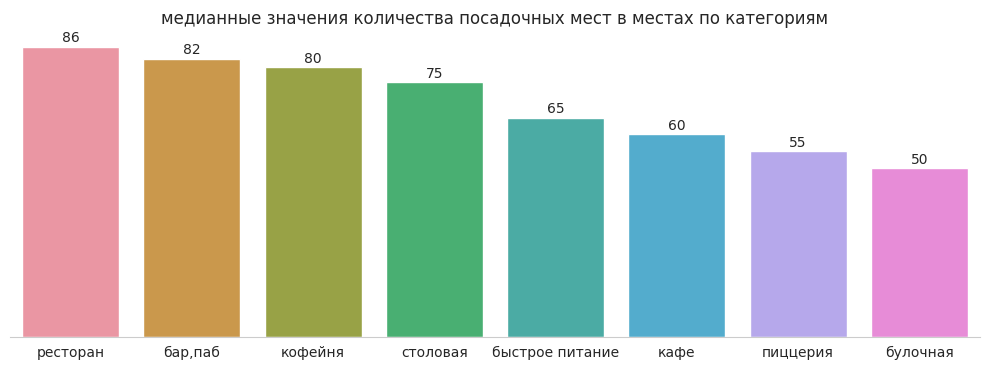

In [ ]:
# визуализация 1
plt.figure(figsize=(12, 5))
ax = sns.boxplot(data = df, x = 'category', y = 'seats', order = seats_by_category['category'])
ax.set_title('Количество посадочных мест по категориям', fontsize=12)
ax.set_ylabel('Количество мест', fontsize=10)
plt.xticks(fontsize=10)
plt.xlabel(" ")


# визуализация 2
plt.figure(figsize = (10,4))
ax = sns.barplot(data = seats_by_category, x = 'category', y = 'seats_median')
ax.set_xticklabels(ax.get_xticklabels(), size = 10)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.title("медианные значения количества посадочных мест в местах по категориям", size=12)
ax.axes.get_yaxis().set_visible(False)
sns.despine(left=True)
plt.xlabel(" ")
plt.tight_layout()

По всем категориям наблюдаются выбросы.

В ресторанах, барах и кофейнях медианные значения количества посадочных мест равны 80 и более.

Наименьшее медианное значение по посадочным местам наблюдается в кафе, пиццериях и булочных: 60, 55, 50 мест соответственно.

### Cоотношение сетевых и несетевых заведений

In [ ]:
fig = go.Figure(data = go.Pie(labels = df['chain'].value_counts().reset_index(), values = df['chain'].value_counts()),
                layout = go.Layout(title = go.layout.Title(text = "Соотношение сетевых и несетевых заведений по количеству"),
                                   height = 400, width = 800))
for trace in fig.data:
    trace['labels'] = ['Несетевые', 'Сетевые']
fig.show()

Несетевых заведений - 61,9% против 38,1% сетевых заведений.

## Какие категории заведений чаще являются сетевыми

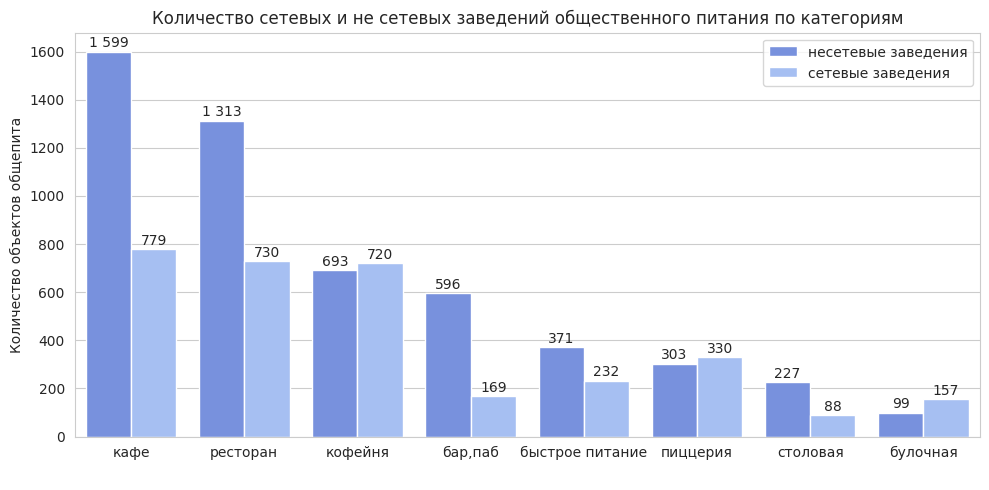

In [ ]:
plt.figure(figsize=(10,5))
labels=["несетевые заведения", "сетевые заведения"]
ax = sns.barplot(x = 'category',
            y = 'name_lower',
            hue = 'chain',
            data = df.groupby(['category','chain'], as_index = False).agg({'name_lower':'count'}).sort_values(by = 'name_lower', ascending = False))
ax.set_xticklabels(ax.get_xticklabels(), size=10)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.title('Количество сетевых и не сетевых заведений общественного питания по категориям')
plt.xlabel('Категория общепита')
plt.ylabel('Количество объектов общепита')
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels)
plt.xlabel(" ")
plt.tight_layout()

In [ ]:
df_chain_rate = df.pivot_table(index = ['category'], columns='chain', values='name_lower', aggfunc='count').reset_index()
df_chain_rate.columns = ['category','chain_count','not_chain_count']
df_chain_rate['total_count'] = df_chain_rate['chain_count'] + df_chain_rate['not_chain_count']
df_chain_rate['chain_rate'] = round((df_chain_rate['not_chain_count'] / df_chain_rate['total_count']) / (df_chain_rate['chain_count'] / df_chain_rate['total_count']), 2)
df_chain_rate.sort_values('chain_rate', ascending = False)

,category,chain_count,not_chain_count,total_count,chain_rate
1,булочная,99,157,256,1.59
5,пиццерия,303,330,633,1.09
4,кофейня,693,720,1413,1.04
2,быстрое питание,371,232,603,0.63
6,ресторан,1313,730,2043,0.56
3,кафе,1599,779,2378,0.49
7,столовая,227,88,315,0.39
0,"бар,паб",596,169,765,0.28


Чаще сетевыми заведениями являются кофейни, пиццерии и булочные - более 50% заведений.

Наиболее редки сетевые заведения в категориях "бар,паб" и "столовая"

## Топ-15 популярных сетей в Москве

In [ ]:
df_top_15 = df[df['chain'] == True].pivot_table(index = ['category', 'name'], values = 'chain', aggfunc = 'count')\
         .sort_values(by = 'chain', ascending = False).reset_index().head(15)
df_top_15.columns = ['category', 'name', 'count']
df_top_15

,category,name,count
0,кофейня,Шоколадница,119
1,пиццерия,Домино'с Пицца,76
2,пиццерия,Додо Пицца,74
3,кофейня,One Price Coffee,71
4,ресторан,Яндекс Лавка,69
5,кофейня,Cofix,65
6,ресторан,Prime,49
7,кофейня,КОФЕПОРТ,42
8,кафе,Кулинарная лавка братьев Караваевых,39
9,ресторан,Теремок,36


In [ ]:
# визуализация
fig = px.sunburst(df_top_15, path = ['category', 'name'], values  = 'count',
                  height = 600, width = 1000,
                  hover_data = ['count'])
fig.update_layout(margin = dict(t = 45, l = 10, r = 10, b = 10),
                  title_text = 'Топ-15 популярных сетей в Москве и их категории',
                  title_x = 0.5)
fig.show()

In [ ]:
df_top_15_category = df_top_15.groupby('category')['count'].sum().reset_index()
df_top_15_category['prc'] = round(df_top_15_category['count'] / df_top_15_category['count'].sum() * 100, 1)
df_top_15_category['prc'] = df_top_15_category['prc'].astype('str')+'%'
df_top_15_category.sort_values('count', ascending = False)

,category,count,prc
2,кофейня,350,45.6%
4,ресторан,154,20.1%
3,пиццерия,150,19.5%
1,кафе,89,11.6%
0,булочная,25,3.3%


Большая часть сетевых заведений из топ-15 по популярности относится к  категории 'Кофейня'

Наименее популярная категория – 'булочная'

## Какие административные районы Москвы присутствуют в датасете

In [ ]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [ ]:
df['district_abbr'] = df['district'].replace(
    {'Северный административный округ': 'САО',
     'Северо-Восточный административный округ': 'СВАО',
     'Северо-Западный административный округ': 'СЗАО',
     'Западный административный округ': 'ЗАО',
     'Центральный административный округ': 'ЦАО',
     'Восточный административный округ': 'ВАО',
     'Юго-Восточный административный округ': 'ЮВАО',
     'Южный административный округ': 'ЮАО',
     'Юго-Западный административный округ': 'ЮЗАО'}
    )
df_district_category = df.groupby(['district_abbr', 'category'], as_index=False)['name_lower'].count() \
.sort_values(by= ['district_abbr', 'name_lower']).reset_index()
#df_district_category

In [ ]:
# визуализация
fig = px.bar(df_district_category, x = 'district_abbr', y = 'name_lower',
             color = 'category', template = 'plotly_white', height = 800, width = 1200,
             text = 'name_lower', title = "Количество заведений каждой категории по округам",
             labels={
                     "name_lower": "Количество заведений",
                     "district_abbr": "Название административного округа",
                     "category": "Категория"}
            )
fig.update_xaxes(categoryorder = "total descending")
fig.show()

Центральный административный округ (ЦАО) очевидно лидирует по количеству заведений всех категорий.

Так же в ЦАО преобладает доля ресторанов, в то время как в других округах преобладает категория 'Кафе'.

Наименьшее количество заведений в Северо-западном административном округе Москвы

## Распределение средних рейтингов по категориям заведений

In [ ]:
df_category_rating = df.pivot_table(index='category', values='rating', aggfunc='mean').sort_values(by = 'rating', ascending = False).reset_index()
df_category_rating.sort_values(by='rating', ascending=False)

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


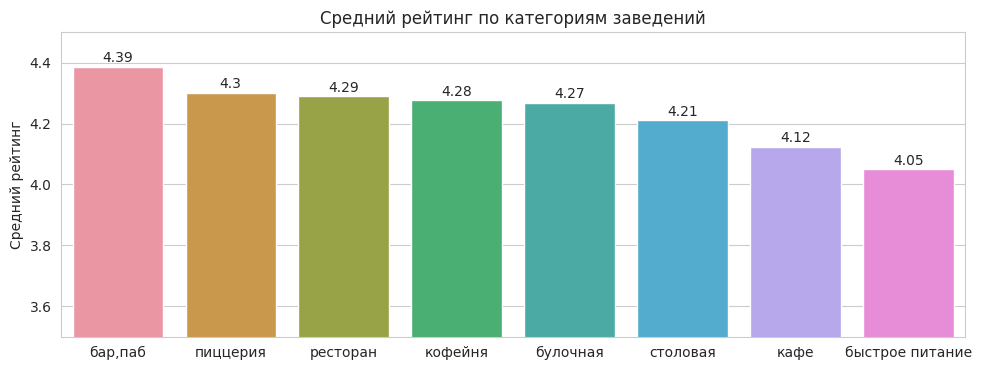

In [ ]:
# визуализация
plt.figure(figsize=(10,4))
ax = sns.barplot(data = df_category_rating, x = 'category', y = 'rating')
ax.set_title('Средний рейтинг по категориям заведений', fontsize=12)
ax.set_ylabel('Средний рейтинг', fontsize=10)
for p in ax.patches:
    ax.annotate(format(p.get_height().round(2), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
ax.set_ylim(3.5, 4.5)
plt.xlabel(" ")
plt.tight_layout()

Наиболее высокие оценки получают получают бары и пабы (Можно предположить что это связано в наличием алкоголя в ассортименте), а самые низкие - заведения быстрого питания.

### Распределение средних рейтингов по округам

In [ ]:
df_district_rating = df.pivot_table(index='district_abbr', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False).reset_index()
df_district_rating

,district_abbr,rating
0,ЦАО,4.377520
1,САО,4.239778
2,СЗАО,4.208802
3,ЮАО,4.184417
4,ЗАО,4.181551
5,ВАО,4.174185
6,ЮЗАО,4.172920
7,СВАО,4.148260
8,ЮВАО,4.101120


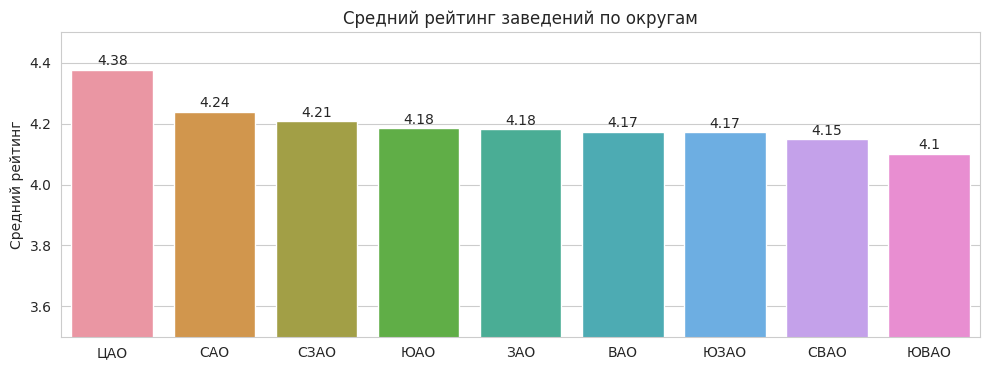

In [ ]:
# визуализация
plt.figure(figsize=(10,4))
ax = sns.barplot(data = df_district_rating, x = 'district_abbr', y = 'rating')
ax.set_title('Средний рейтинг заведений по округам', fontsize=12)
ax.set_ylabel('Средний рейтинг', fontsize=10)
for p in ax.patches:
    ax.annotate(format(p.get_height().round(2), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size=10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
ax.set_ylim(3.5, 4.5)
plt.xlabel(" ")
plt.tight_layout()

In [ ]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = df_district_rating,
    columns = ['district_abbr', 'rating'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Округ:'],
                                   labels  =True, localize = True, sticky = False))

# выводим карту
m

Самый высокий средний рейтинг в Центральном административном округе, самый низкий - в Юго-Восточном.

### Отобразим все заведения на карте

In [ ]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

 ## Топ-15 улиц по количеству заведений

In [ ]:
# выведем Топ-15 улиц по количеству заведений на них
df_streets_top = df['street'].value_counts().head(15).reset_index()
df_streets_top.columns = ['street','count_sum']
df_streets_top

,street,count_sum
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,МКАД,65


In [ ]:
# выведем название улицы, категории и количество заведений в этой категории

df_streets_cat = df.groupby(['street', 'category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)
df_streets_cat.columns = ['street', 'category', 'counts']
df_streets_cat

,street,category,counts
2789,проспект Мира,кафе,53
1358,МКАД,кафе,45
2792,проспект Мира,ресторан,45
2790,проспект Мира,кофейня,36
1963,Профсоюзная улица,кафе,35
...,...,...,...
845,Дендропарковая улица,кафе,1
846,Денежный переулок,ресторан,1
2178,Снежная улица,быстрое питание,1
2177,Снайперская улица,ресторан,1


In [ ]:
df_streets_top = df_streets_cat.merge(df_streets_top, how='inner', on='street')
df_streets_top

,street,category,counts,count_sum
0,проспект Мира,кафе,53,184
1,проспект Мира,ресторан,45,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
...,...,...,...,...
106,улица Вавилова,быстрое питание,11,55
107,улица Вавилова,кофейня,10,55
108,улица Вавилова,пиццерия,3,55
109,улица Вавилова,"бар,паб",2,55


In [ ]:
df_streets_top['percent'] = round(df_streets_top['counts'] / df_streets_top['count_sum'] * 100, 2)
df_streets_top.columns = ['street', 'category', 'count', 'count_street', 'percent']
df_streets_top = df_streets_top.sort_values(by = 'count_street', ascending = False)
df_streets_top.head(20)

,street,category,count,count_street,percent
0,проспект Мира,кафе,53,184,28.80
2,проспект Мира,кофейня,36,184,19.57
3,проспект Мира,быстрое питание,21,184,11.41
4,проспект Мира,"бар,паб",12,184,6.52
5,проспект Мира,пиццерия,11,184,5.98
6,проспект Мира,булочная,4,184,2.17
7,проспект Мира,столовая,2,184,1.09
1,проспект Мира,ресторан,45,184,24.46
15,Профсоюзная улица,ресторан,26,122,21.31
21,Профсоюзная улица,столовая,3,122,2.46


In [ ]:
# визуализация
fig = px.bar(df_streets_top, x = 'street', y = 'count', color = 'category', text = 'percent',
                       labels={"count": "Количество заведений",
                               "street": "Название улицы",
                               "category": "Категория"},
             title="Распределение категорий по ТОП-15 улицам",
             template = 'plotly_white',
             height = 800)
fig.update_traces(textfont_size = 10, textangle = 0)
fig.show()

По количеству заведений лидирует проспект Мира - 184 заведений, в конце списка  улица Пятницкая - 48 заведений.

## Улицы, на которых находится только один объект общепита

In [ ]:
df_streets_one_cafe = df.groupby(['street'])['name'].nunique().to_frame().index
df_streets_one_cafe

Index([' 1-й Автозаводский проезд', ' 1-й Балтийский переулок',
       ' 1-й Варшавский проезд', ' 1-й Вешняковский проезд',
       ' 1-й Волоколамский проезд', ' 1-й Голутвинский переулок',
       ' 1-й Грайвороновский проезд', ' 1-й Дербеневский переулок',
       ' 1-й Дорожный проезд', ' 1-й Земельный переулок',
       ...
       ' улица Шкулёва', ' улица Шумкина', ' улица Шухова', ' улица Щепкина',
       ' улица Щипок', ' улица Юннатов', ' улица Юности',
       ' улица Юных Ленинцев', ' улица Яблочкова', ' шоссе Энтузиастов'],
      dtype='object', name='street', length=1393)

В названиях многих улиц с одним заведением общепита присутствуют слова "проезд", "переулок", что говорит о том, что это короткие улицы.

In [ ]:
df_district_one_cafe = df.pivot_table(index = ['district_abbr', 'street'], values = 'name', aggfunc = 'count').reset_index()
df_district_one_cafe = df_district_one_cafe.query('name==1')
df_district_one_cafe

,district_abbr,street,name
0,ВАО,1-й Кирпичный переулок,1
3,ВАО,1-я Боевская улица,1
6,ВАО,1-я Парковая улица,1
7,ВАО,11-я Парковая улица,1
8,ВАО,12-я Парковая улица,1
...,...,...,...
1431,ЮЗАО,улица Паустовского,1
1432,ЮЗАО,улица Ремизова,1
1433,ЮЗАО,улица Рокотова,1
1434,ЮЗАО,улица Саморы Машела,1


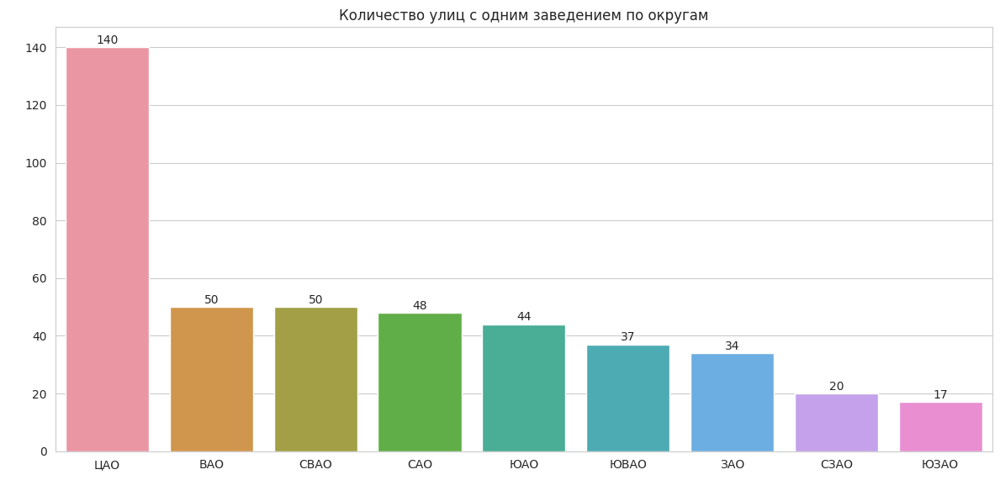

In [ ]:
plt.figure(figsize=(12, 6))
ax = sns.countplot(x = 'district_abbr', data = df_district_one_cafe, order = df_district_one_cafe['district_abbr'].value_counts().index)
ax.set_title('Количество улиц с одним заведением по округам', fontsize = 12)
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size = 10)
plt.xlabel(" ")
plt.ylabel(" ")
plt.tight_layout()

Больше всего улиц с одним заведением в Центральном административном округе.
Меньше всего - в ЮЗАО.

### Проанализируем средний чек заведений по разным округам.

In [ ]:
df_middle_avg_bill = df.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
df_middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [ ]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = df_middle_avg_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний чек заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Округ:'],
                                   labels  =True, localize = True, sticky = False))

# выводим карту
m

Центральный и Западный административные округа имеют самый высокий средний чек. Самые низкие средние чеки в Южном, Юго-Восточном и Северо-Восточном округе.

### Исследуем зависимость часов работы заведений от расположения заведения.

In [ ]:
df_round_clock = df.groupby('district', as_index=False)['is_24/7'].mean().sort_values(by='is_24/7', ascending=False)
df_round_clock

,district,is_24/7
6,Юго-Восточный административный округ,0.130252
0,Восточный административный округ,0.121554
4,Северо-Западный административный округ,0.105134
7,Юго-Западный административный округ,0.102962
1,Западный административный округ,0.084606
3,Северо-Восточный административный округ,0.084175
8,Южный административный округ,0.084081
2,Северный административный округ,0.078889
5,Центральный административный округ,0.058430


In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = df_round_clock,
    columns = ['district', 'is_24/7'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Округ:'],
                                   labels  =True, localize = True, sticky = False))

m

Больше всего круглосуточных заведений расположено в восточном и юго-восточном административных округах, меньше всего - в ЦАО.


## Детализируем исследование: открытие кофейни

### Количество кофеен в датасете

In [ ]:
df_cafe = df.query('category == "кофейня"').pivot_table(index = 'district', values = 'name', aggfunc='count').reset_index().sort_values(by = 'name', ascending=False)
df_cafe.columns = ['district', 'count']
print('Общее количество кофеен в Москве:', df_cafe['count'].sum())
df_cafe

Общее количество кофеен в Москве: 1413


,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [ ]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

choropleth = folium.Choropleth(
    geo_data = state_geo,
    data = df_cafe,
    columns = ['district', 'count'],
    key_on = 'feature.name',
    fill_color = 'YlGn',
    fill_opacity = 0.5,
    legend_name = 'Средний рейтинг заведений по районам',
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(fields = ['name'], aliases = ['Округ:'],
                                   labels  =True, localize = True, sticky = False))
m

Больше всего кофеен расположено в Центральном административном округе - 428, меньше всего в Северо-Западном административном округе - 62 заведения

### Проверим есть ли круглосуточные кофейни

In [ ]:
print('Количество кофеен работающих круглосуточно:', df[((df['category'] == "кофейня") & (df['is_24/7'] == True))]['is_24/7'].count())

Количество кофеен работающих круглосуточно: 59


### Рейтинги кофеен по округам

In [ ]:
df_cafe_rating =df.query('category == "кофейня"').pivot_table(index='district_abbr', values='rating', aggfunc='mean').reset_index()\
.sort_values(by='rating', ascending=False)
df_cafe_rating.columns = ['district', 'avg_rating']
df_cafe_rating

,district,avg_rating
5,ЦАО,4.336449
4,СЗАО,4.325806
2,САО,4.291710
8,ЮЗАО,4.283333
0,ВАО,4.282857
6,ЮАО,4.232824
7,ЮВАО,4.225843
3,СВАО,4.216981
1,ЗАО,4.195333


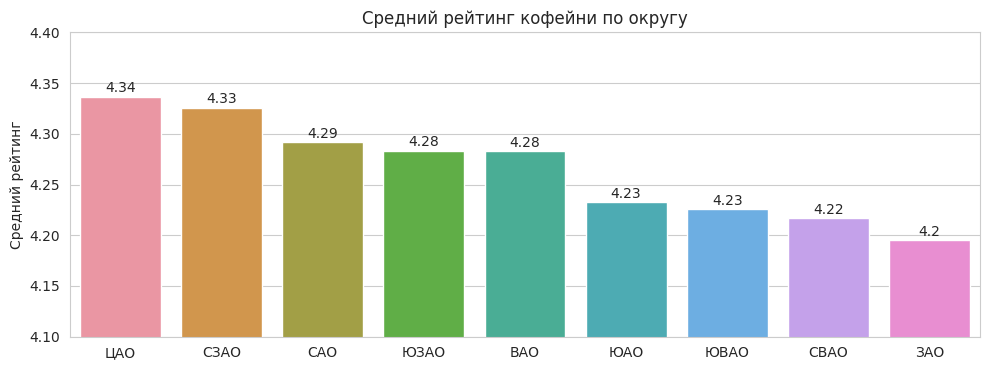

In [ ]:
# визуализация
plt.figure(figsize=(10,4))
ax = sns.barplot(data = df_cafe_rating, x = 'district', y = 'avg_rating')
ax.set_title('Средний рейтинг кофейни по округу', fontsize=12)
ax.set_ylabel('Средний рейтинг', fontsize=10)
for p in ax.patches:
    ax.annotate(format(p.get_height().round(2), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size = 10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
ax.set_ylim(4.1, 4.4)
plt.xlabel(" ")
plt.tight_layout()

Разброс рейтинга кофеен по районам не большой: максимальный рейтинг в Центральном административном округе - 4.34 и Северо-Западном административном округе - 4.33, а минимальный в Западном - 4.20.

### Определим стоимость чашки капучино в разных округах Москвы

In [ ]:
df_middle_coffee_cup = df.query('category == "кофейня"').pivot_table(index = 'district_abbr',
                                                                     values='middle_coffee_cup',
                                                                     aggfunc='mean').sort_values(by='middle_coffee_cup',
                                                                                                 ascending=False).reset_index()
df_middle_coffee_cup.columns = ['district', 'mean_bill']
df_middle_coffee_cup

,district,mean_bill
0,ЗАО,189.938776
1,ЦАО,187.518519
2,ЮЗАО,184.176471
3,ВАО,174.023810
4,САО,165.789474
5,СЗАО,165.523810
6,СВАО,165.333333
7,ЮАО,158.488372
8,ЮВАО,151.088235


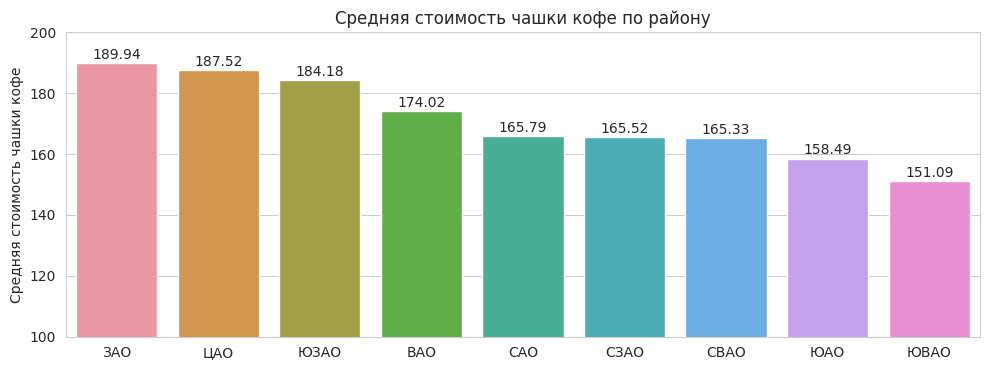

In [ ]:
# визуализация
plt.figure(figsize=(10,4))
ax = sns.barplot(data = df_middle_coffee_cup, x = 'district', y = 'mean_bill')
ax.set_title('Средняя стоимость чашки кофе по району', fontsize=12)
ax.set_ylabel('Средняя стоимость чашки кофе', fontsize=10)
for p in ax.patches:
    ax.annotate(format(p.get_height().round(2), ',').replace(',', ' '),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha = 'center', va = 'center',
                   xytext = (0, 6),
                   textcoords = 'offset points', size = 10)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
ax.set_ylim(100, 200)
plt.xlabel(" ")
plt.tight_layout()

Ожидаемо максимальные цены за чашку капучино - в Западном и Центральных Округах, минимальные цены - в Южном и Юго-восточном Округах.

## Общий вывод



*  Наиболее популярные категории заведений общественного питания в Москве - кафе, ресторан, кофейня, наименее популярны булочные и столовые.
*  В ресторанах, барах и кофейнях медианные значения количества посадочных мест равны 80 и более. Наименьшее медианное значение по посадочным местам наблюдается в кафе, пиццериях и булочных: 60, 55, 50 мест соответственно.
*  Несетевых заведений больше сетевых в соотношении 61,9% против 38,1%. Чаще сетевыми заведениями являются кофейни, пиццерии и булочные - более 50% заведений. Наиболее редки сетевые заведения в категориях "бар,паб" и "столовая"
*  Большая часть сетевых заведений из топ-15 по популярности относится к категории 'Кофейня'. Наименее популярная категория – 'булочная'
*  В Центральном Административном Округе количество заведений более чем в 2 раза превышает количество заведений в других округах. Наименьшее количество заведений в Северо-западном административном округе Москвы
*  По количеству заведений лидирует проспект Мира - 184 заведений, в конце списка улица Пятницкая - 48 заведений.
*  Наиболее высокие оценки получают бары и пабы, самые низкие - заведения быстрого питания.
*  Максимальный средний рейтинг у заведений в Центральном Административном округе
*  Самый высокий средний чек в Центральном  и Западном административных округах
*  В Центральном и Западном административных округах самая высокая средняя стоимость чашки кофе

Рекомендации по открытию кофейни

*  Не смотря на то, что самый популярный округ для категории “Кофейни” - Центральный (ЦАО), этот округ уже насыщен множеством других заведений общепита, более чем вдвое превышая количество подобных заведений в других округах. Конкурировать в подобной среде будет весьма не просто.
*  Для открытия кофейни стоит рассмотреть Западный административный округ: средняя стоимость чашки капучино в этом округе самая высокая (и превышает стоимость в ЦАО), а средний рейтинг кофеен самый низкий среди всех округов. Соответственно оптимальный вектор в стратегии открытия и развития кофейни в этом округе - качество обслуживания



# Презентация

[Презентация "Исследование рынка заведений общественного питания г. Москвы"](https://github.com/aboro-net/yandex_practicum_data-analysis/blob/main/09_research_Moscow_catering_market/research_Moscow_catering_market.pdf) (GitHub)
